# Import the library

In [1]:
import torch
from transformers import CLIPImageProcessor, CLIPVisionModel

from diffusers import AutoencoderKL, DDPMScheduler
from diffusers.utils import load_image, make_image_grid
from src.diffusers.models.referencenet.referencenet_unet_2d_condition import (
    ReferenceNetModel,
)
from src.diffusers.models.referencenet.unet_2d_condition import UNet2DConditionModel
from src.diffusers.pipelines.referencenet.pipeline_referencenet import (
    StableDiffusionReferenceNetPipeline,
)

/home/han-wei/miniconda3/envs/face-anon-simple/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Create & load models

In [2]:
face_model_id = "hkung/face-anon-simple"
clip_model_id = "openai/clip-vit-large-patch14"
sd_model_id = "sd2-community/stable-diffusion-2-1"

unet = UNet2DConditionModel.from_pretrained(
    face_model_id, subfolder="unet", use_safetensors=True
)
referencenet = ReferenceNetModel.from_pretrained(
    face_model_id, subfolder="referencenet", use_safetensors=True
)
conditioning_referencenet = ReferenceNetModel.from_pretrained(
    face_model_id, subfolder="conditioning_referencenet", use_safetensors=True
)
vae = AutoencoderKL.from_pretrained(sd_model_id, subfolder="vae", use_safetensors=True)
scheduler = DDPMScheduler.from_pretrained(
    sd_model_id, subfolder="scheduler", use_safetensors=True
)
feature_extractor = CLIPImageProcessor.from_pretrained(
    clip_model_id, use_safetensors=True
)
image_encoder = CLIPVisionModel.from_pretrained(clip_model_id, use_safetensors=True)

pipe = StableDiffusionReferenceNetPipeline(
    unet=unet,
    referencenet=referencenet,
    conditioning_referencenet=conditioning_referencenet,
    vae=vae,
    feature_extractor=feature_extractor,
    image_encoder=image_encoder,
    scheduler=scheduler,
)
pipe = pipe.to("cuda")

generator = torch.manual_seed(1)

/home/han-wei/miniconda3/envs/face-anon-simple/lib/python3.8/site-packages/huggingface_hub/file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


# Anonymize images with a single aligned face

Create an anonymized version of an image if the image contains a single face and that face has already been aligned similarly to those in the [FFHQ](https://github.com/NVlabs/ffhq-dataset) or [CelebA-HQ](https://github.com/tkarras/progressive_growing_of_gans) datasets.

100%|██████████| 200/200 [01:12<00:00,  2.76it/s]


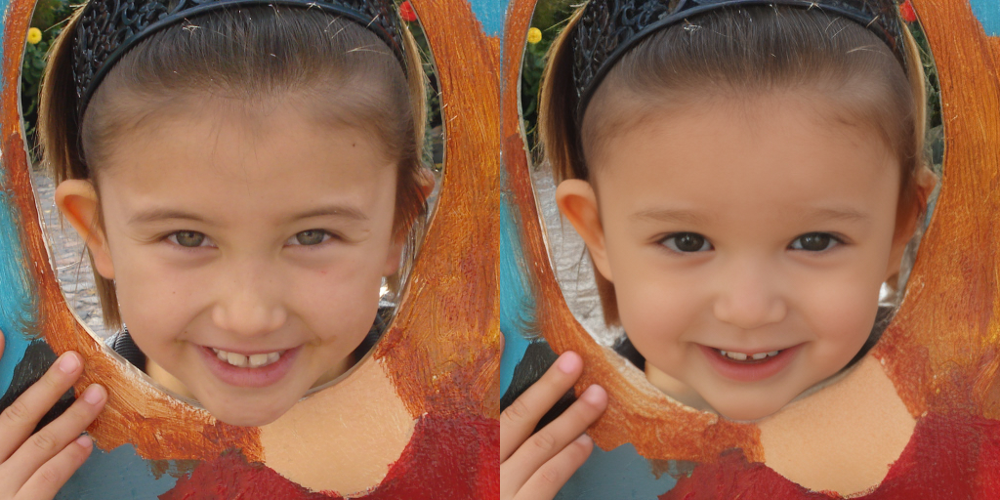

In [ ]:
# get an input image for anonymization
original_image = load_image("my_dataset/test/14795.png")

# generate an image that anonymizes faces
anon_image = pipe(
    source_image=original_image,
    conditioning_image=original_image,
    num_inference_steps=200,
    guidance_scale=4.0,
    generator=generator,
    anonymization_degree=1.25,
    width=512,
    height=512,
).images[0]
make_image_grid([original_image, anon_image], rows=1, cols=2)


# Anonymize images with one or multiple unaligned faces
Create an anonymized version of an image if it contains one or more unaligned faces.

100%|██████████| 25/25 [00:09<00:00,  2.70it/s]


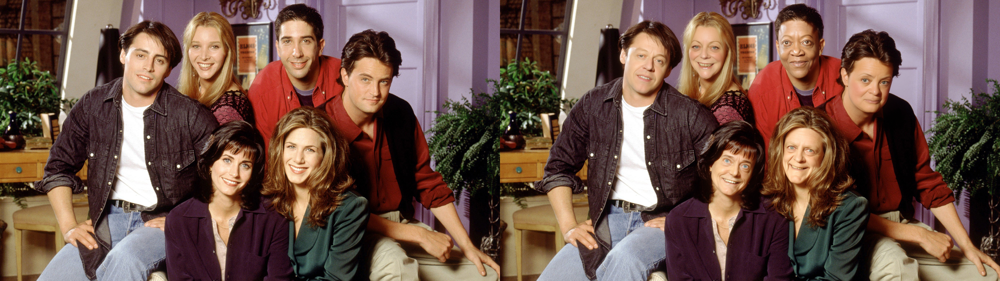

In [4]:
import face_alignment
from utils.anonymize_faces_in_image import anonymize_faces_in_image

# get an input image for anonymization
original_image = load_image("my_dataset/test/friends.jpg")

# SFD (likely best results, but slower)
fa = face_alignment.FaceAlignment(
    face_alignment.LandmarksType.TWO_D, face_detector="sfd"
)

# generate an image that anonymizes faces
anon_image = anonymize_faces_in_image(
    image=original_image,
    face_alignment=fa,
    pipe=pipe,
    generator=generator,
    face_image_size=512,
    num_inference_steps=25,
    guidance_scale=4.0,
    anonymization_degree=1.25,
)
make_image_grid([original_image, anon_image], rows=1, cols=2)

# Swap faces between two images

100%|██████████| 200/200 [01:13<00:00,  2.71it/s]


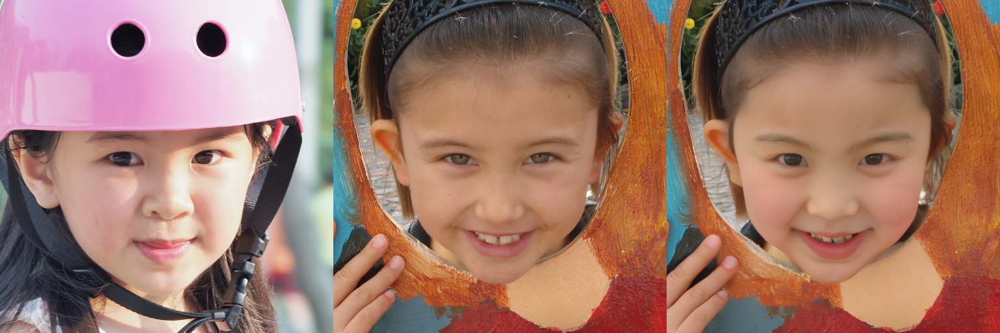

In [ ]:
# get source and conditioning (driving) images for face swap
source_image = load_image("my_dataset/test/00482.png")
conditioning_image = load_image("my_dataset/test/14795.png")

# generate an image that swaps faces
swap_image = pipe(
    source_image=source_image,
    conditioning_image=conditioning_image,
    num_inference_steps=200,
    guidance_scale=4.0,
    generator=generator,
    anonymization_degree=0.0,
    width=512,
    height=512,
).images[0]
make_image_grid([source_image, conditioning_image, swap_image], rows=1, cols=3)